# Dataset figures

import packages

In [3]:
%load_ext autoreload
%autoreload 2
import scanpy as sc
import anndata as ad
import pandas as pd
from matplotlib import rcParams
import matplotlib.pyplot as pl
import numpy as np
# import scrublet as scr
import seaborn as sb
import scipy as sci
from scipy.sparse import csr_matrix
#from scanpy.tools import rna_velocity
import scvelo as scv
import loompy
import leidenalg
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from scipy import sparse
# import bbknn
import os
import glob
from itertools import chain
from datetime import datetime

import function file

In [4]:
import EC_processing_Functions as seq

In [5]:
sc.settings.set_figure_params(dpi=50,dpi_save=600,)
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.6 umap==0.4.6 numpy==1.19.2 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.9.8 louvain==0.7.1


In [8]:
os.chdir("path to the folder above dataset folder")

In [7]:
all_marker={
    "Marker": ["PECAM1", "CDH5", "KDR", "ESM1", "ETS1", "NRP1", "NRP2", "EFNB2", "EPHB4",
               "PDGFA", "PDGFB", "ANGPT2", "APLNR",  "PLAUR", "DLL4", #"FN1", 
               #"ZEB1", "SNAI2",  
               "PLAU", "ACTA2", "PDGFRB"#, "TGFB1"
              ],
    "Angio Signaling": ["KDR", "FLT1", "FLT4", "TEK", "TIE1", "EFNB2", "EFNA1", "NRP2", 
                        "CCND1",
#                                  "PLXNA2", "TMEM100", 
                        "HIF3A", "HIF1A"],
    "Angiogenesis Related": ["CD93","ENG","EHD4","CTNNB1","MMRN2", #"ADAMTS9", 
                              # "PDGFRA",  "APOLD1", 
                             "PTPRB",  "IQGAP2", "PTPRM", "TEK", "PDPN", "TNFRSF12A",
                            "FLT1"],
    "Cell-Cell Adhesion": [#'COL4A4', 'COL4A3BP', 'COL4A6', 'COL4A5', 'COL4A1', 'COL4A2', 'COL18A1',
                           "NECTIN2", "NECTIN3", "FYN", "CLDN5","THBS1"],
    "Cell Cell Interaction": [#"CD47",                                                                     #3
                          "THBS1", #"CDH5",
                          "DOCK4", "ROBO1", "RAPH1", "CD44", "PDGFRA"
                          ],
    "Cell Migration endo": [ "AMOTL2", "EDN1", "ANXA1", "ZEB2", "RHOB", "SGK1","NRP2"#,
#                        "RAC1","RACK1"
#                 "COLEC10", "AMOTL2","EDN1", "PODXL", 
#                                "PLXNA2", "ITGA6", "SGK1",# "ENG", "GAB1"
                      ],
    "Cell Migration mural": ["ACTN1", "EMP3", "ENC1", "SVIL", "NEXN"],
    "mTOR": ["MTOR", "RICTOR", "DEPTOR", "LAMTOR1", "SGK1", "INSR"],                                                #4
    "ECM": ["COL4A1", "COL4A2", "COL6A2", "COL18A1", "COL15A1"],                                                #3
    "ECM Binding": ["TNC", "LUM", "HAPLN1", "FBLN1", "HSPG2"],                                                #3
    "ECM": ["COL3A1", "COL6A1", "COL4A1", "COL4A2", "LAMA5", "LAMB2", "LAMA4", "LAMB1", 
        "LAMC1", "ITGA3", "ITGA4", "ITGAV", "ITGA1", "ITGA2", "ITGA8", "ITGB1"],
    "ECM Remodeling": ["MMP2", "MMP9", "MMP14", "MMP16", "ADAMTS1", "CEMIP2", "SERPING1", "SERPINE2",
                      "COL18A1", "COL6A1", "COL3A1", "COL6A2", "LAMB2", "ITGA1", "ITGA2"],
    "all_ITGs": sorted([el for el in adata.raw.var_names if "ITG" in el]),
    "angio_ITGs": ['ITGA1', 'ITGA2', 'ITGA4', 'ITGA5',  'ITGA9', 'ITGAV'#, 'ITGB1'
                   ,'ITGB3'
                  ],
    "NOTCH": ["NOTCH1", "NOTCH4", "DLL4", "HES4", "HEY1", "GJA5", "NRARP", "TCIM"
         ],
    "Proliferation": [#"CCND1", "CDKN1C", 
                  "FOS", "JUN", "JUNB", "TNFRSF12A"],
    "TGF-beta": ["TGFB1", "SMAD7", "SMAD9", "BMP4", "GJA5", "TGFBR3", "DAB2", "FURIN"],
    
}

## Dataset 1 - 3D suspendion culture from day 0 to day 9 

This dataset is uses in Fig. 1, Fig. 2, and Fig. S3

In [7]:
adata=sc.read_h5ad("./processed/dataset_1.h5ad")

marker_angioblast_state

Fig. 1 b and Fig. S3 a

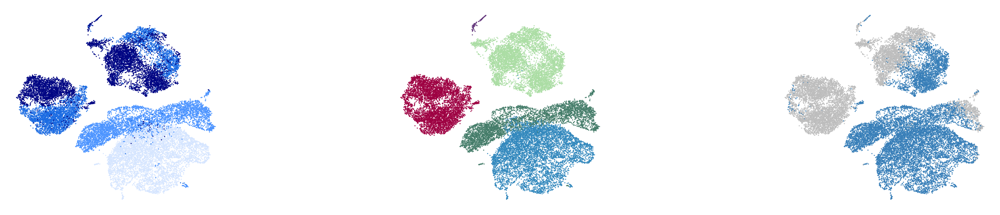

In [9]:
sc.pl.umap(adata, color=["batch", "leiden_anno", "proliferation"],
           title=['','',''], legend_loc=None, frameon=False,
           save="_day0to9.png",
           wspace=.6)

Fig. 1 c

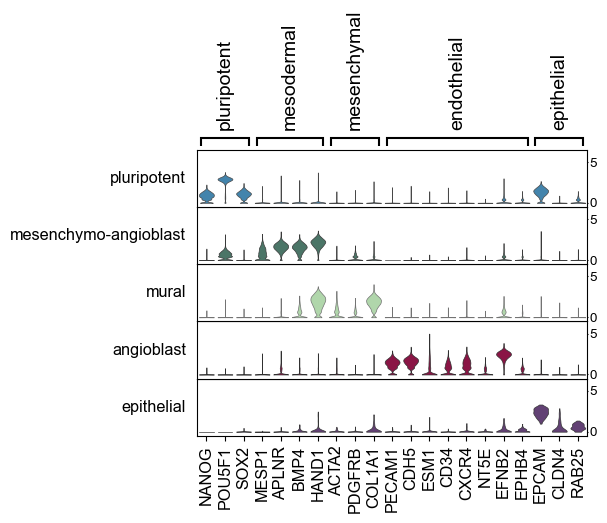

In [10]:
Vio_marker ={'pluripotent': ['NANOG', 'POU5F1', 'SOX2'],
 'mesodermal': ['MESP1',"APLNR", 'BMP4', 'HAND1'],
 'mesenchymal': ['ACTA2', 'PDGFRB','COL1A1'],
 'endothelial': ['PECAM1', 'CDH5', 'ESM1','CD34', 'CXCR4', 'NT5E',"EFNB2", "EPHB4"],
 'epithelial': ['EPCAM','CLDN4', 'RAB25'] }

filename="violin_day0t9"
annotation="leiden_anno"
# with PdfPages('./figures/'+filename+'.pdf') as pdf:
axes = sc.pl.stacked_violin(adata,var_names=Vio_marker,groupby=annotation,#swap_axes=True,
                 row_palette= list(adata.uns[annotation+'_colors'][-2:])+list(adata.uns[annotation+'_colors'][:-2]),
                  show=False, var_group_rotation=90)

for ax in axes:
    ax.set_ylim(-0.5, 6.5)
    plt.savefig('./figures/'+filename+'-esm1.pdf')        
plt.show()

Fig. 1 d

I:\DATA\HPC\Thesis_data\ToC./figures/day0-9_day 0_kuchen.pdf


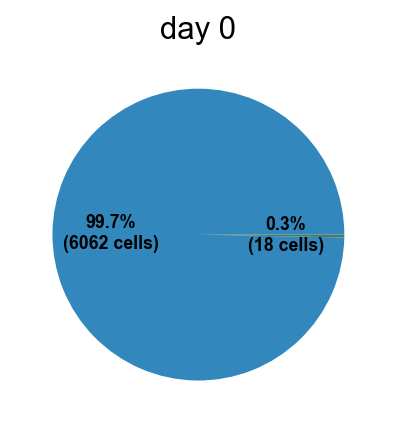

I:\DATA\HPC\Thesis_data\ToC./figures/day0-9_day 3_kuchen.pdf


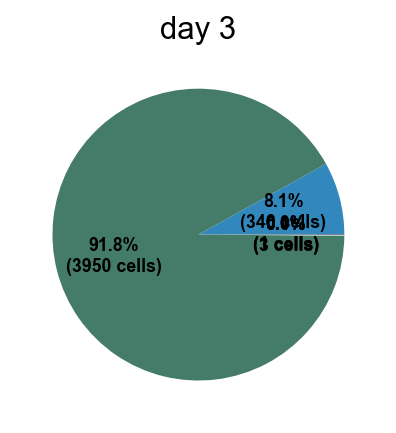

I:\DATA\HPC\Thesis_data\ToC./figures/day0-9_day 6_kuchen.pdf


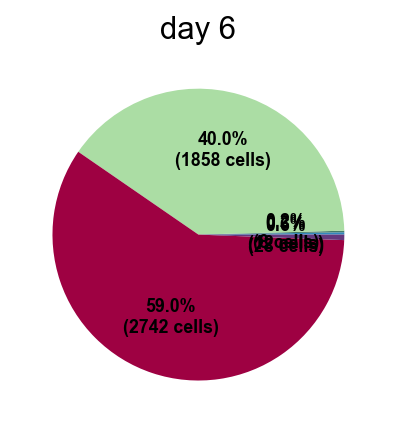

I:\DATA\HPC\Thesis_data\ToC./figures/day0-9_day 9_kuchen.pdf


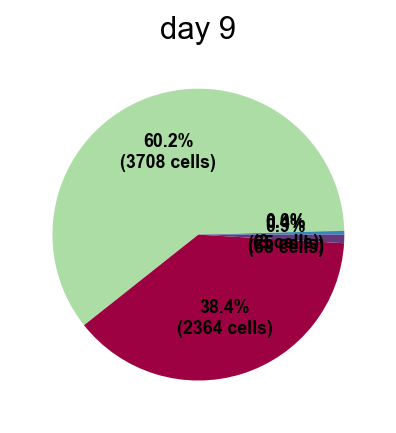

In [36]:
ident="leiden_anno"
for batch_cat in adata.obs.batch.cat.categories:
    
    recipe=pd.crosstab(adata[np.isin(adata.obs.batch,batch_cat)].obs[ident],"A")
    fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))
    data = list(recipe["A"])
    ingredients = list(recipe.index)
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        return "{:.1f}%\n({:d} cells)".format(pct, absolute)
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                      textprops=dict(color="black"),
                                     colors=adata.uns[ident+"_colors"])
    plt.setp(autotexts, size=8, weight="bold")
    ax.set_title(batch_cat)
    
    save_my_file=os.getcwd()+"./figures/day0-9_"+batch_cat+'_kuchen.pdf'
    print(save_my_file)

    plt.savefig(save_my_file) 
    plt.show()

## Dataset 2 - 3D suspension culture from day 0 to day 9, velocity integration

This dataset is used in Fig. 2

In [6]:
adata=sc.read_h5ad("./processed/dataset_2.h5ad")

Fig. 2 a

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_20220622_day0-9_latent_time.png


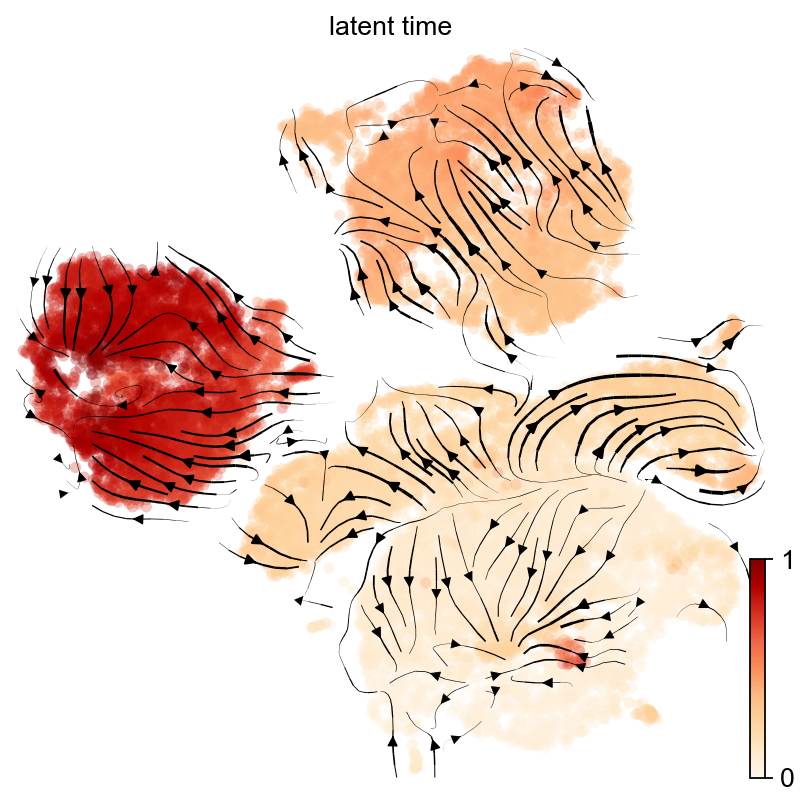

In [418]:
scv.settings.set_figure_params('scvelo',dpi=80,dpi_save=600) 
scv.pl.velocity_embedding_stream(adata, basis='umap',color=["latent_time"],
                                 figsize = (6, 6),
                                 save="20220622_day0-9_latent_time.pdf",
                                 legend_loc="right",color_map="OrRd")
sc.settings.set_figure_params(dpi=80,dpi_save=600,transparent=True)

Fig. 2 b

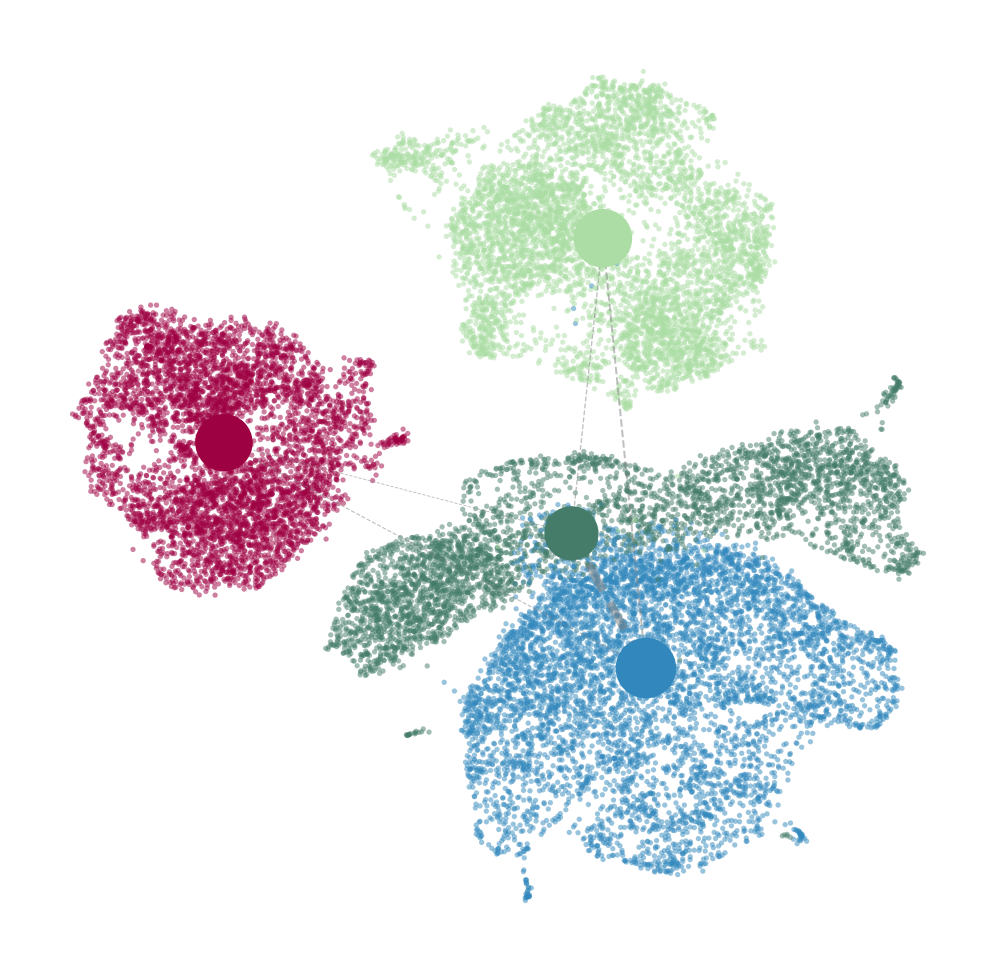

In [121]:
# scv.tl.paga(adata,"leiden_anno",#vkey='latent_time',
# #     use_time_prior="latent_time"
#            )
sc.settings.set_figure_params(dpi=150,dpi_save=600,)
# fig1, ax1 = plt.subplots()
scv.pl.paga(adata, basis='umap', threshold=0.005,  title='', legend_loc=None, #'right',
            frameon=False, edge_width_scale=4,  #min_edge_width=2, max_edge_width=4,
            single_component=True, 
#            save="paga_overlay_d0to9_all.pdf"
           )
# plt.savefig('./figures/paga_overlay_d12mc_based_on_latent_time.pdf', dpi=600, format='pdf')
sc.settings.set_figure_params(dpi=50,dpi_save=600,)

calculate dynamic driver genes for Fig. 2 c

In [409]:
scv.tl.rank_dynamical_genes(adata, groupby='leiden_anno',n_genes=300)
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(15)

ranking genes by cluster-specific likelihoods
    finished (0:00:37) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,pluripotent,mesenchymo-angioblast,mural,angioblast
0,DPPA4,MAGED2,LIMCH1,FLT1
1,L1TD1,HAS2,BAMBI,LIMCH1
2,POLR3G,SIPA1L2,NPM1,MEF2C
3,TERF1,CDH11,COL3A1,CALCRL
4,GABRB3,COLEC12,COLEC12,PLK2
5,PTPRZ1,ALPK2,MYO6,EFNB2
6,NPM1,BAMBI,CGNL1,DEPTOR
7,EPCAM,LGR5,MEIS2,TJP1
8,SEPHS1,UNC5C,ADD3,ARHGAP29
9,GRID2,DIAPH3,TPM1,ERG


Fig. 2 c

860
saving figure to file ./figures/scvelo_heatmap_20201214_likelihood_genes_all.png


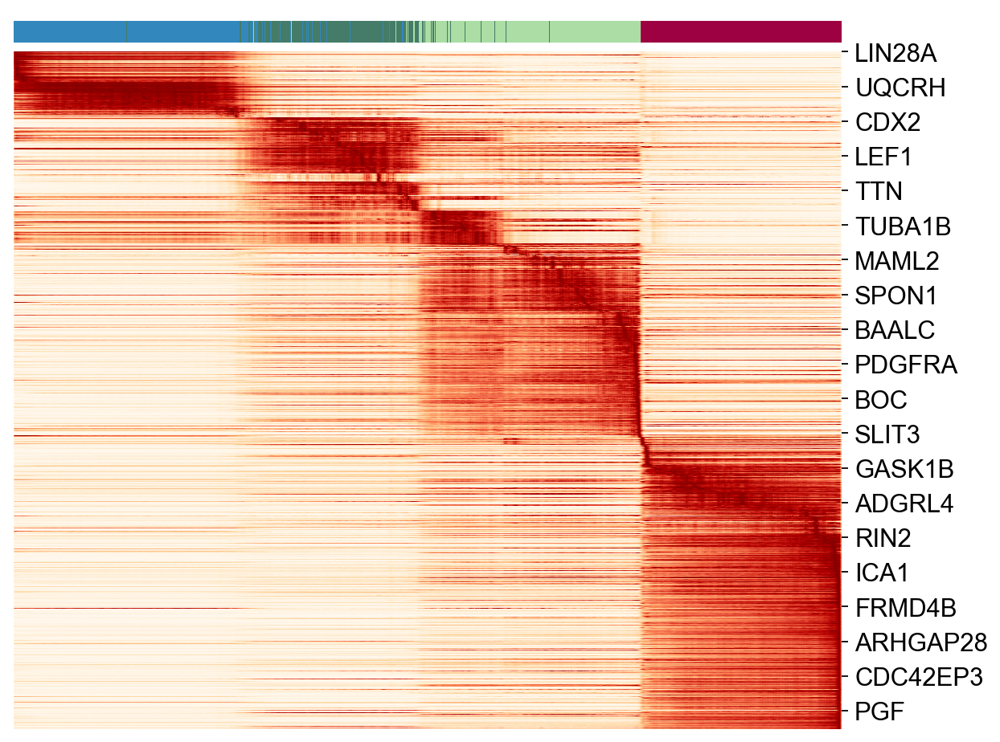

In [58]:
print(len(list(set(chain(*df.values.tolist())))))
scv.pl.heatmap(adata, var_names=list(set(chain(*df.values.tolist()))), tkey='latent_time', 
               n_convolve=100, col_color='leiden_anno',
               figsize= (8,6),
               save="20201214_likelihood_genes_all.png",
              color_map = "OrRd")

select unique cluster specific DDGs for angioblast and mural cells

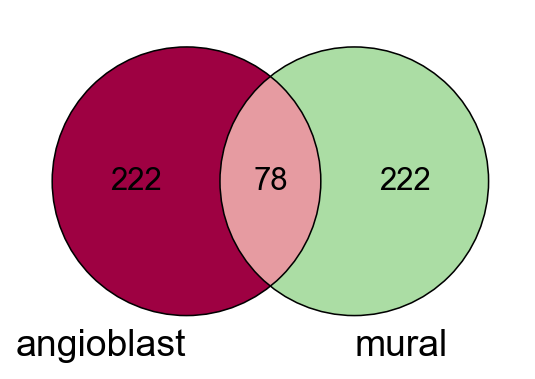

In [42]:
EC_dynamic_genes=set(df["angioblast"])
PVC_dynamic_genes=set(df["mural"])

from matplotlib_venn import venn2, venn2_circles
or_1 = EC_dynamic_genes - PVC_dynamic_genes
or_2 = PVC_dynamic_genes - EC_dynamic_genes
and_12 = PVC_dynamic_genes & EC_dynamic_genes

a= venn2(subsets=(len(or_1), len(or_2), len(and_12)), 
      set_labels = ('angioblast', 'mural'),
     set_colors=('#9e0142', '#abdda4'), alpha = 1)
a= venn2_circles(subsets=(len(or_1), len(or_2), len(and_12)), linewidth=0.7)

In [48]:
df=pd.DataFrame({"angioblast": list(or_1), "mural": list(or_2)})

In [77]:
df.to_excel(r'./processed/'+'day0to9'+'_unique_DDGs_anno.xlsx',index=False)

Fig. 2 d
    
TFEA scores are plotted in R

In [75]:
nr_of_tf=18
ec_df=pd.read_csv(glob.glob("./chea3/*.tsv")[0],sep = "\t")
mc_df=pd.read_csv(glob.glob("./chea3/*.tsv")[1],sep = "\t")

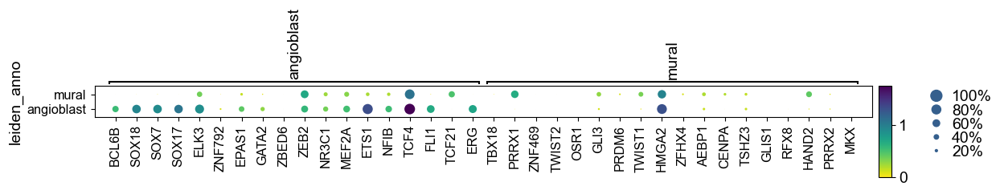

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[12.6, 0, 0.2, 0.5, 0.25])

In [76]:
tf_dict={"angioblast": ec_df["TF"].to_list()[:nr_of_tf],
        "mural": mc_df["TF"].to_list()[:nr_of_tf]}
sc.pl.dotplot(adata[np.isin(adata.obs.leiden_anno,['angioblast','mural'])]
              ,tf_dict,groupby="leiden_anno", #use_raw=True,
#              save="_tf_day0to9.pdf",
             color_map="viridis_r")

The on off sates of the enriched TFs

saving figure to file ./figures/scvelo_scatter_un_spliced_eTFs_angioblast.png


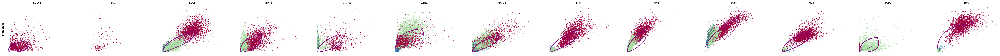

saving figure to file ./figures/scvelo_scatter_un_spliced_eTFs_mural.png


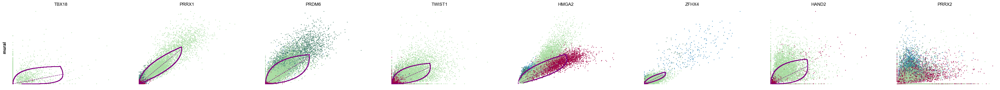

In [123]:
tf_df=pd.DataFrame(tf_dict)
scv.settings.set_figure_params('scvelo',dpi=50,dpi_save=600,vector_friendly=True) 
for cluster in list(tf_df.columns):
    scv.pl.scatter(adata, tf_df[cluster], ylabel=cluster, frameon=False,color="leiden_anno"#,use_raw=True
                   ,save="scatter_un_spliced_eTFs_"+cluster+".png"
               )
sc.settings.set_figure_params(dpi=50,dpi_save=600,transparent=True)

## Dataset 3 - 3D suspendion culture from day 9, two independent differentiations 

This dataset is used in Fig. S3

In [6]:
adata=sc.read_h5ad("./processed/dataset_3.h5ad")

Fig. S3 c

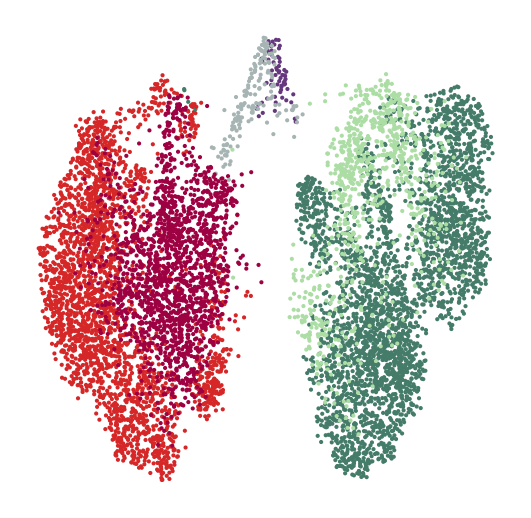

In [7]:
sc.pl.umap(adata,color=["ct_bybatch"],
           title=[''], legend_loc=None, frameon=False,
#        save="_d9_1_2.png",
           color_map="OrRd",
      wspace=0.6)

Fig. S3 d

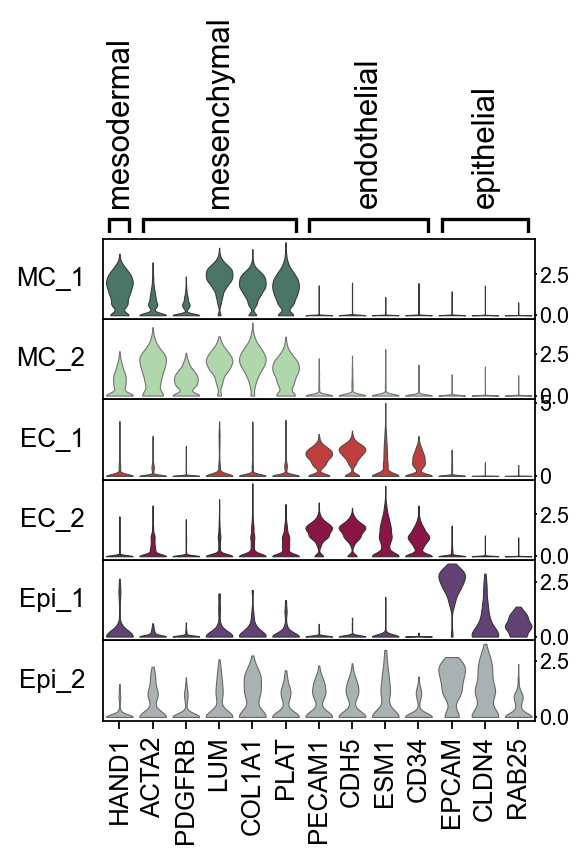

In [8]:
Vio_marker ={'mesodermal': ['HAND1'],
             'mesenchymal': ['ACTA2', 'PDGFRB']+[ 'LUM', 'COL1A1', 'PLAT'],
             'endothelial': ['PECAM1', 'CDH5', 'ESM1',"CD34"],#+["EFNB2","EPHB4"],
             'epithelial': ['EPCAM','CLDN4', 'RAB25'],            
            }

filename="20210317_st_vio_day9_reproducibility"
ident="ct_bybatch"
axes = sc.pl.stacked_violin(adata,var_names=Vio_marker,groupby=ident,#swap_axes=True,
                row_palette= list(adata.uns[ident+'_colors'][-2:])+list(adata.uns[ident+'_colors'][:-2]),
                  show=False,#standard_scale=5,#size=5,
                 #save=filename+'_no_ax.pdf',
                 #cut=0,dendrogram=True,
#[cols_leid[0],cols_leid[1],cols_leid[2:15]],#cols_leid,#adata.uns['leiden_colors'],
                var_group_rotation=90)

# for ax in axes:
#       ax.set_ylim(-0.5, 6.5)
#plt.savefig('./'+filename+'_ax.pdf')        
plt.show()

## Dataset 4 - Comparison 3D and 2D cell culture on day 9 and 8, respectively 

This dataset is used in Fig. 3 and Fig. S4

In [14]:
adata=sc.read_h5ad("./processed/dataset_4.h5ad")

Fig. 3 a

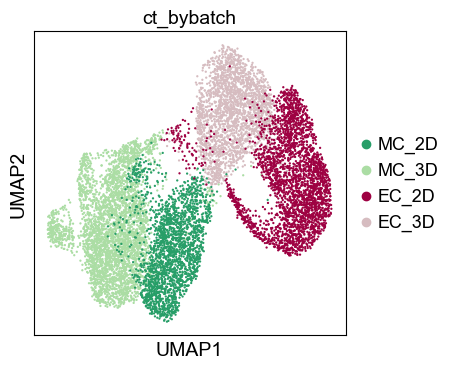

In [6]:
sc.pl.umap(adata, color=["ct_bybatch"])

Fig. 3 b

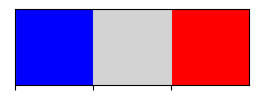

In [85]:
my_cols=['b', 'lightgrey','r']
sns.palplot(my_cols)

In [86]:
sc.tl.rank_genes_groups(adata, "ct_bybatch", 
                        groups=["EC_3D"], 
                        reference="EC_2D", 
                        n_genes=adata.raw.var_names.size)
dge_df = seq.rank_genes_groups_df(adata, group="EC_3D")
# determinate thresholds
log_cut_off=100
lfc_cut_off=15

dge_df['hue']=["otheres" for el in list(range(len(dge_df)))]

dge_df['hue'] = dge_df.apply(lambda x : '3D genes' if abs(x['logfoldchanges']) > 0.50 
                             and x['pvals_adj'] < 10**-(log_cut_off)
                             and x['logfoldchanges']  > 0
                             else x['hue'], axis=1)

dge_df['hue'] = dge_df.apply(lambda x : '2D genes' if abs(x['logfoldchanges']) > 0.50 
                             and x['pvals_adj'] < 10**-(log_cut_off)
                             and x['logfoldchanges'] <  0
                             else x['hue'], axis=1)

ranking genes
    finished (0:00:00)


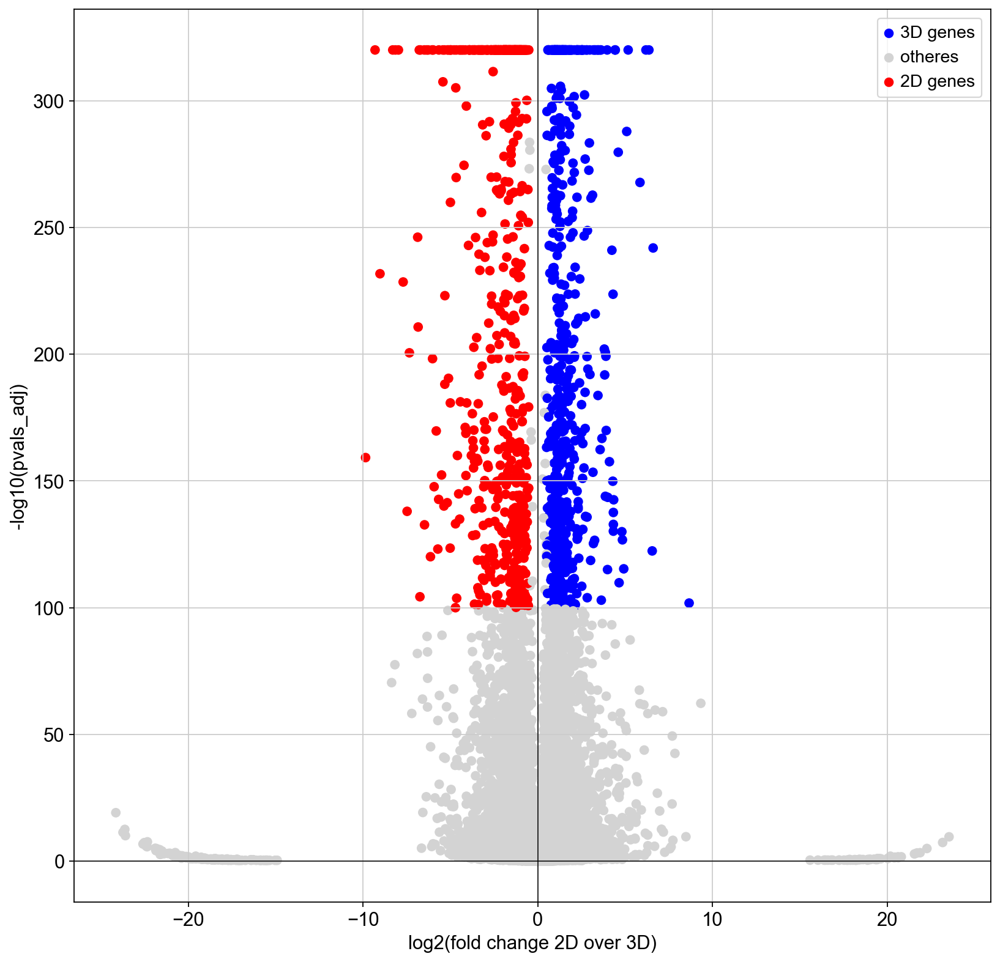

In [131]:
log_cut_off=100
lfc_cut_off=15

plt.figure(figsize=(12,12))
ax = sns.scatterplot(
    data=dge_df,
    x='logfoldchanges',
    y='-log10(pvals_adj)',
    hue='hue', # {0: top100, 1: top-100, 2: others, 3: angiogenesis, 4: ribosomal, 5: TGFB_related, 6:oxidative}
    palette = my_cols,
    #['#4c94ff', '#1b6be2', '#d5e5ff','#DD1F25', '#a5a5a5','#f9e639','#2aff00'],
    s=50,
    legend="brief",
    linewidth=0
)

ax.legend()

#ax.set_xlim([-7.3,7.3])

## lines
ax.axes.axhline(y=0, color='black', linewidth=0.7, alpha=1 ,ls='-')
ax.axes.axvline(x=0, color='black', linewidth=0.7, alpha=1 ,ls='-')
## texts
ax.set_title("")
ax.set_xlabel("log2(fold change 2D over 3D)")

# ax.axes.axhline(y=log_cut_off, color='black', linewidth=0.7, alpha=1 ,ls='--')
# ax.axes.axvline(x=lfc_cut_off, color='black', linewidth=0.7, alpha=1 ,ls='--')
# ax.axes.axvline(x=-lfc_cut_off, color='black', linewidth=0.7, alpha=1 ,ls='--')
# ax.axes.axvline(x=-0.5, color='black', linewidth=0.7, alpha=1 ,ls='--')
# ax.axes.axvline(x=0.5, color='black', linewidth=0.7, alpha=1 ,ls='--')
plt.savefig('./figures/20201216_volcano_EC_2Dvs3D_DEG_b.pdf',format='pdf',dpi=600)  
plt.show()

In [101]:
gene_dict={"angioblast":list(dge_df[dge_df["hue"]=="3D genes"]["names"]),
                 "ECs 2D":list(dge_df[dge_df["hue"]=="2D genes"]["names"])}
df = pd.DataFrame.from_dict(gene_dict, orient ='index').T
df.to_excel(r'./processed/day8-9_DEGs_anno.xlsx',index=False)

Fig. 3 c

In [9]:
sub_s_mk={
    "col1":['COL11A1', 'COL1A2', 'COL14A1', 'COL15A1', 'COL13A1', 'COL1A1'],
    "ECM": ["COL4A1", "COL4A2", "COL6A2", "COL18A1", "COL15A1"],    
    "ECM-binding": ["LUM", "HAPLN1","HSPG2","HAS2"],
    "cell adhesion": ["THBS1", "DOCK4", "ROBO1", "RAPH1", "CD44", "PDGFRA", "CLDN5"],
    "angiogenic signaling": ["CD93","ENG","EHD4","CTNNB1", "IQGAP2", #"TEK", 
#                             "FLT1", "KDR", "MMP14", "CD34", "CXCR4", "CXCL12",
                             "RASIP1","RAP1B","RAPGEF5"]
}

In [11]:
adata.obs['ct_bybatch'].cat.reorder_categories([
    'EC_2D', 'MC_2D', 'EC_3D', 'MC_3D'
        ], inplace=True)

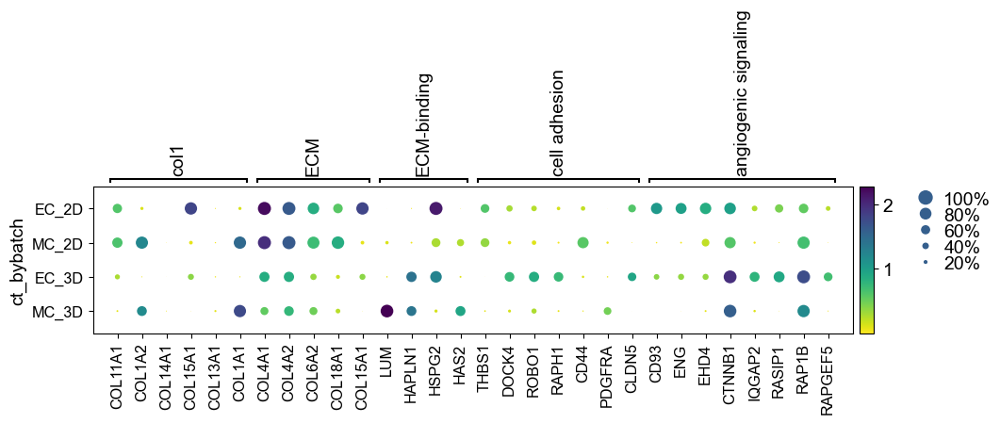

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[10.5, 0, 0.2, 0.5, 0.25])

In [12]:
sc.pl.dotplot(adata
              ,sub_s_mk,
              groupby="ct_bybatch",color_map="viridis_r",
              save="_d8_9_selma_nds.pdf"
             )

Fig. S4

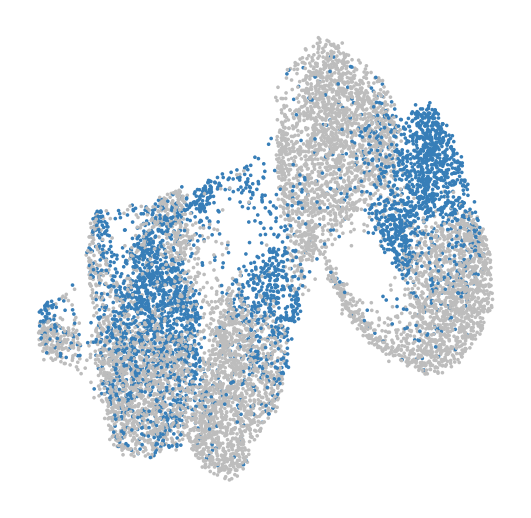

In [134]:
sc.pl.umap(adata, color=['proliferation'#"ct_bybatch"#,"leiden_anno","batch"
                        ],title="",legend_loc=None, frameon=False,
          save="day89_prol.png")

## Dataset 5 - 3D suspension vs 3D Matrigel culture on day 12

This dataset is used in Fig. 4

In [9]:
adata=sc.read_h5ad('./processed/dataset_5.h5ad')

Fig. 4 b

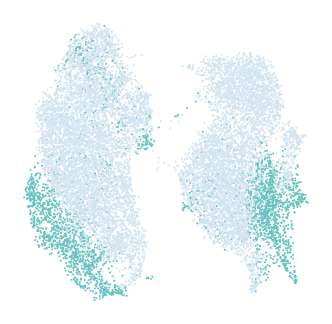

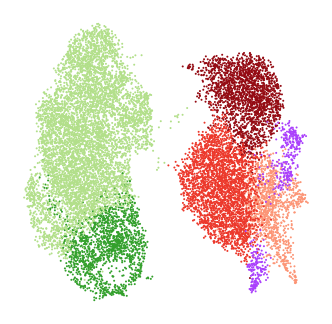

In [11]:
sc.pl.umap(adata,color=["batch"],
           title='', legend_loc=None, #'right',
            frameon=False,
#            save="_day12mc_batch.png",
           color_map="OrRd")
sc.pl.umap(adata,color=["leiden_anno"],#leiden_anno
           title='', legend_loc=None, #'right',
            frameon=False,
#            save="_day12mc_leiden_anno.png",
           color_map="OrRd")

Fig. 4 c

E:\SR\EC_Data./figures/day12mc_d12c2_kuchen.pdf


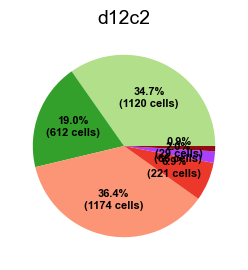

E:\SR\EC_Data./figures/day12mc_d12m2_kuchen.pdf


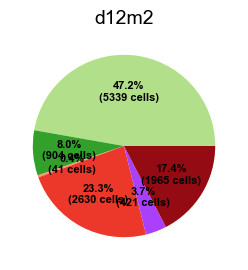

In [53]:
ident="leiden_anno"
for batch_cat in adata.obs.batch.cat.categories:
    
    recipe=pd.crosstab(adata[np.isin(adata.obs.batch,batch_cat)].obs[ident],"A")
    fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))
    data = list(recipe["A"])
    ingredients = list(recipe.index)
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        return "{:.1f}%\n({:d} cells)".format(pct, absolute)
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                      textprops=dict(color="black"),
                                     colors=adata.uns[ident+"_colors"])
    plt.setp(autotexts, size=8, weight="bold")
    ax.set_title(batch_cat)
    
    save_my_file=os.getcwd()+"./figures/day12mc_"+batch_cat+'_kuchen.pdf'
    print(save_my_file)

    plt.savefig(save_my_file) 
    plt.show()

Fig. 4 e

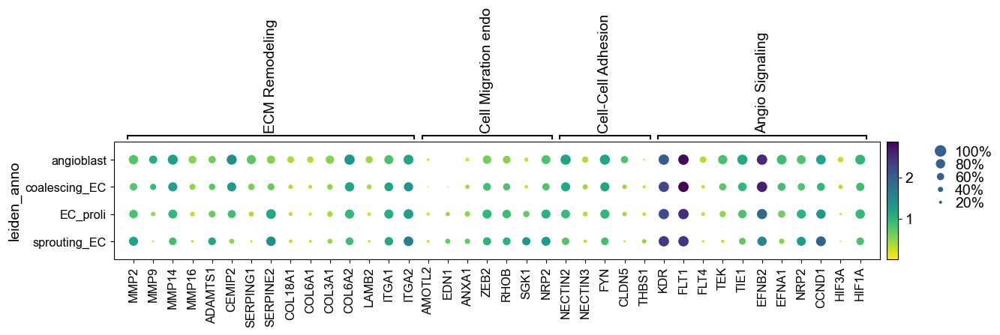

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[13.299999999999999, 0, 0.2, 0.5, 0.25])

In [8]:
sc.pl.dotplot(adata[np.isin(adata.obs.leiden_anno,
                            [el for el in list(adata.obs.leiden_anno.cat.categories) if not "mural" in el])]
              ,{key: all_marker[key] for key in ["ECM Remodeling","Cell Migration endo",
                                                "Cell-Cell Adhesion","Angio Signaling"]},
              save="_20211103_day12mc_selected_markers.pdf",
              groupby="leiden_anno",color_map="viridis_r"
             )

Fig. S6 b

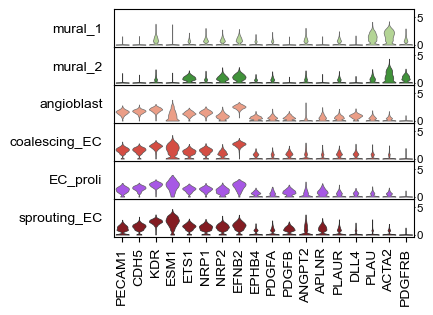

In [24]:
scv.settings.set_figure_params('scvelo',dpi=50,dpi_save=600)  # for beautified visualization
axes = sc.pl.stacked_violin(adata,var_names=all_marker["Marker"],
                            figsize = [4,3],
                            row_palette=adata.uns["leiden_anno_colors"],
                            groupby="leiden_anno",show=False,
                            var_group_rotation=90)

for ax in axes:
      ax.set_ylim(-0.5, 6.5)
plt.savefig('./figures/violin_day12mc_leiden_anno.pdf')        
plt.show()

Fig. S8 a is plotted in R

Fig. S8 b

TFEA scores are plotted in R

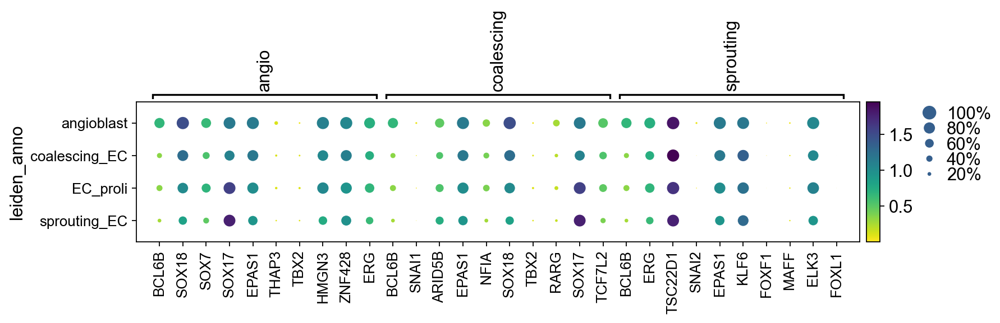

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[10.5, 0, 0.2, 0.5, 0.25])

In [105]:
TFEA_12={'angio':['BCL6B', 'SOX18', 'SOX7', 'SOX17', 'EPAS1', 'THAP3', 'TBX2', 'HMGN3', 'ZNF428', 'ERG'],
'coalescing':['BCL6B', 'SNAI1', 'ARID5B', 'EPAS1', 'NFIA', 'SOX18', 'TBX2', 'RARG', 'SOX17', 'TCF7L2'], 
'sprouting':['BCL6B', 'ERG', 'TSC22D1', 'SNAI2', 'EPAS1', 'KLF6', 'FOXF1', 'MAFF', 'ELK3', 'FOXL1']}
sc.pl.dotplot(adata[np.isin(adata.obs.leiden_anno,
                            [el for el in list(adata.obs.leiden_anno.cat.categories) if not "mural" in el])]
              ,TFEA_12,
              save="_20211103_day12mc_selected_markers.pdf",
              groupby="leiden_anno",color_map="viridis_r"
             )

Fig. S8 c

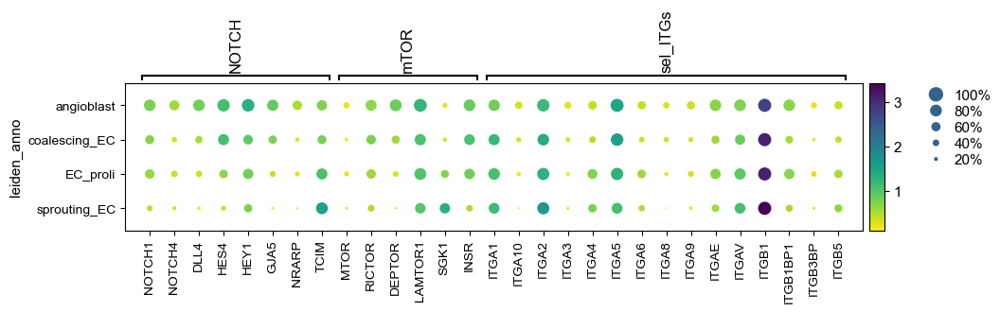

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[10.149999999999999, 0, 0.2, 0.5, 0.25])

In [44]:
sc.pl.dotplot(adata[np.isin(adata.obs.leiden_anno,
                            [el for el in list(adata.obs.leiden_anno.cat.categories) if not "mural" in el])]
              ,{key: all_marker[key] for key in ["NOTCH","mTOR","sel_ITGs"]},
              save="_day12mc_notch_mTOR.pdf",
              groupby="leiden_anno",color_map="viridis_r"
             )

Table S3

In [60]:
pdf=pd.crosstab(adata.obs.leiden_anno,adata.obs.batch)
df = pd.DataFrame(pdf.to_numpy(), pdf.index.categories, pdf.columns.categories)

In [61]:
batch_sum=list(df.sum())
for i in range(len(df.columns)):
               col=list(df.columns)[i]
               df[col+"_perc"]=round(df[col]/batch_sum[i]*100, 1)

In [62]:
df

,d12c2,d12m2,d12c2_perc,d12m2_perc
mural_1,1120,5339,34.7,47.2
mural_2,612,904,19.0,8.0
angioblast,1175,42,36.4,0.4
coalescing_EC,221,2631,6.9,23.3
EC_proli,66,422,2.0,3.7
sprouting_EC,30,1966,0.9,17.4


# update dataset numbering??

## Dataset 6 - 3D suspension vs 3D Matrigel culture on day 12, velocity integration

In [425]:
adata=sc.read_h5ad(r"./processed/dataset_7.h5ad")

Fig. 4 d

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_paga_overlay_d12mc_dash.png


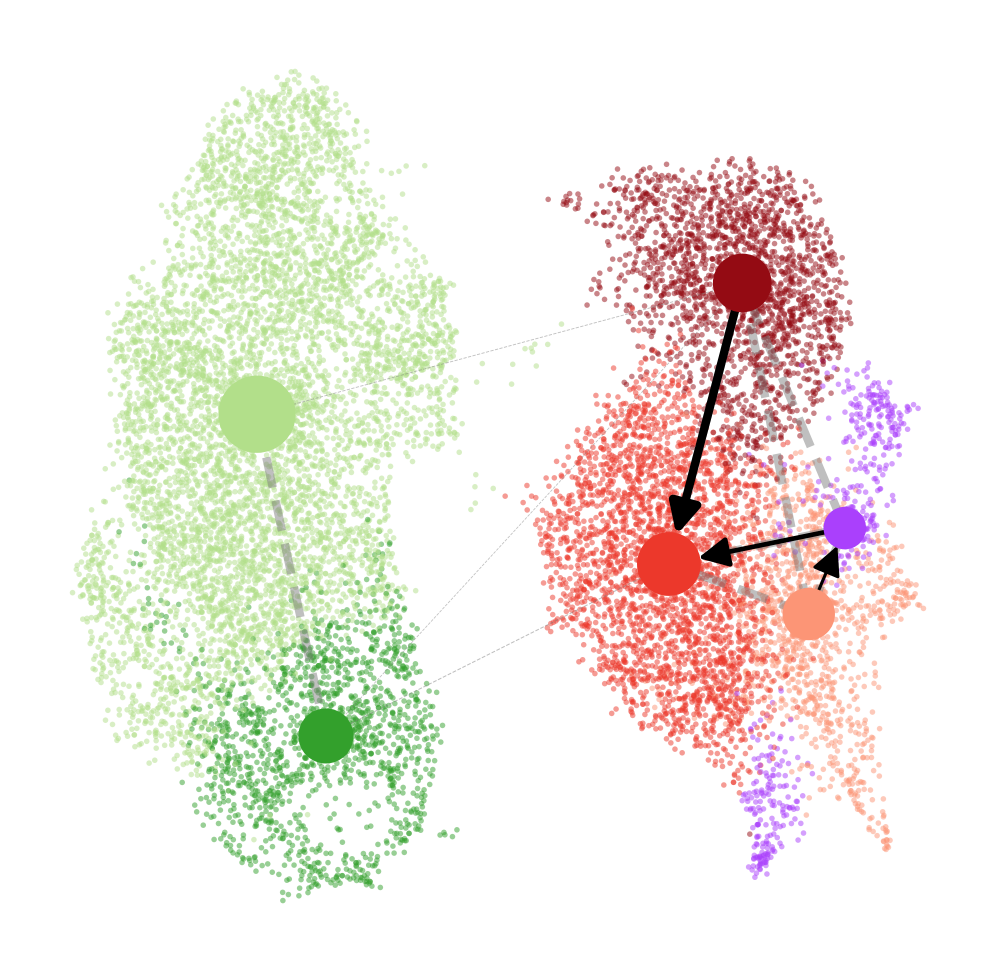

In [459]:
scv.tl.paga(adata,"leiden_anno",#vkey='latent_time',
#     use_time_prior="latent_time"
           )
scv.pl.paga(adata, basis='umap', threshold=0.005,  title='', legend_loc=None, #'right',
            frameon=False, edge_width_scale=4,  #min_edge_width=2, max_edge_width=4,
            single_component=True, 
           save="paga_overlay_d12mc_dash.pdf"
           )

Fig. 4 skipped

computing latent time using root_cells as prior
    finished (0:00:08) --> added 
    'latent_time', shared time (adata.obs)
figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_20220622_day12mc_latent_time.png


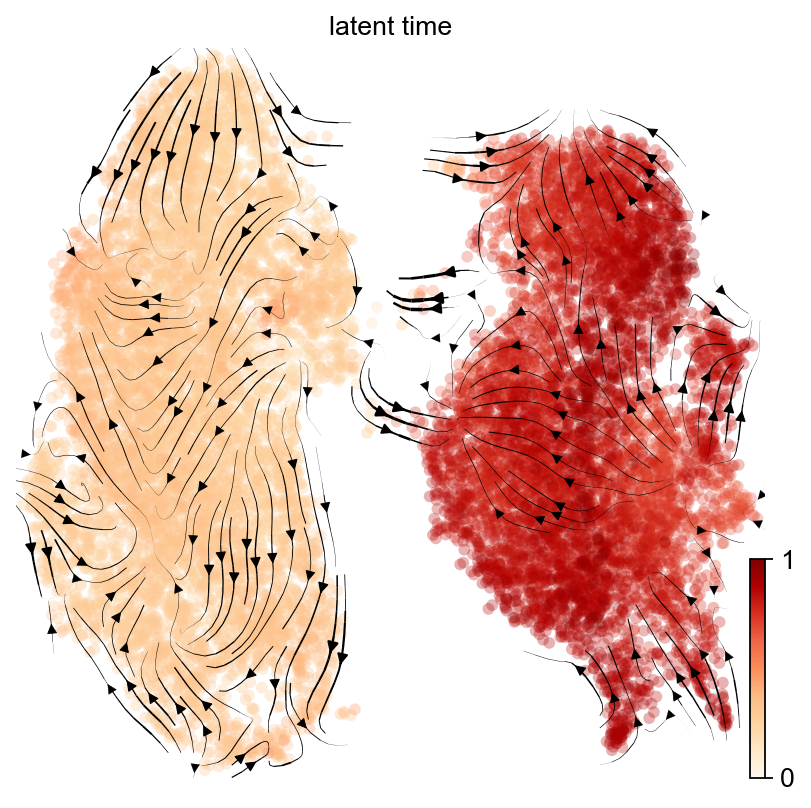

In [427]:
# scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
# scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo',dpi=50,dpi_save=300)  # for beautified visualization
scv.tl.recover_latent_time(adata)
# # sc.settings.set_figure_params(dpi=150,dpi_save=300,transparent=True)
# scv.pl.velocity_embedding_stream(a, basis='umap',color=["latent_time"],
#                                  figsize = (6, 6),
#                                  save="202012_day0-9_latent_time.png",
#                                  legend_loc="right",color_map="OrRd")
scv.pl.velocity_embedding_stream(adata, basis='umap',color=["latent_time"],
                                 figsize = (6, 6),
#                                  save="20220622_day12mc_latent_time.pdf",
                                 legend_loc="right",color_map="OrRd")
sc.settings.set_figure_params(dpi=50,dpi_save=600,transparent=True)

## Dataset 8 - maturation of 3D Matrigel culture up to day 18

This dataset is used in Fig. 5, Fig. S6, Fig. S7, and Fig. 6

In [5]:
adata=sc.read_h5ad("./processed/dataset_8_day12to18.h5ad")

Fig. 5 b

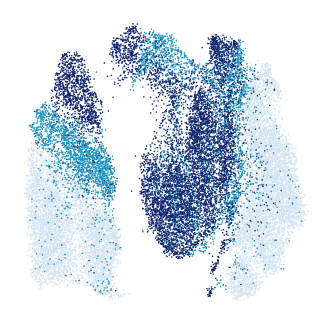

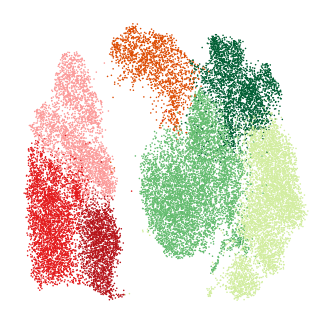

In [12]:
sc.pl.umap(adata,color=["batch"],
           title='', legend_loc=None, #'right',
            frameon=False,
#            save="_day12to18_batch.png",
           color_map="OrRd")
sc.pl.umap(adata,color=["leiden_anno"],
           title='', legend_loc=None, #'right',
            frameon=False,
#            save="_day12to18_leiden_anno.png",
           color_map="OrRd")

Fig. 5 c

I:\DATA\HPC\Thesis_data\ToC./figures/day12-18_d12m2_kuchen.pdf


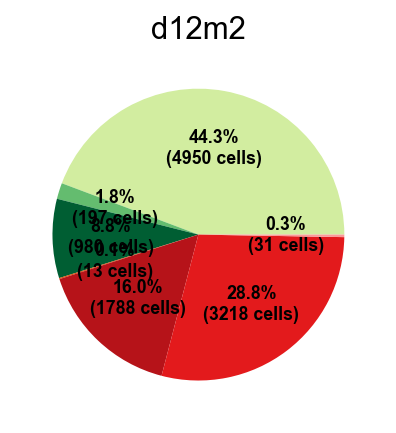

I:\DATA\HPC\Thesis_data\ToC./figures/day12-18_d18m2_kuchen.pdf


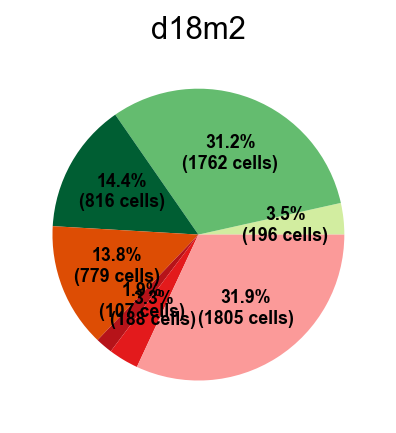

I:\DATA\HPC\Thesis_data\ToC./figures/day12-18_d18a2_kuchen.pdf


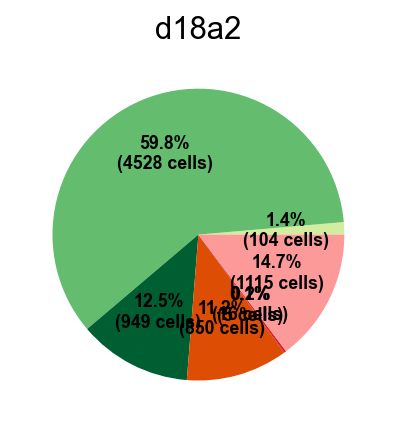

In [54]:
ident="leiden_anno"
for batch_cat in adata.obs.batch.cat.categories:
    
    recipe=pd.crosstab(adata[np.isin(adata.obs.batch,batch_cat)].obs[ident],"A")
    fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))
    data = list(recipe["A"])
    ingredients = list(recipe.index)
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        return "{:.1f}%\n({:d} cells)".format(pct, absolute)
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                      textprops=dict(color="black"),
                                     colors=adata.uns[ident+"_colors"])
    plt.setp(autotexts, size=8, weight="bold")
    ax.set_title(batch_cat)
    
    save_my_file=os.getcwd()+"./figures/day12-18_"+batch_cat+'_kuchen.pdf'
    print(save_my_file)

    plt.savefig(save_my_file) 
    plt.show()

Fig. 5 e

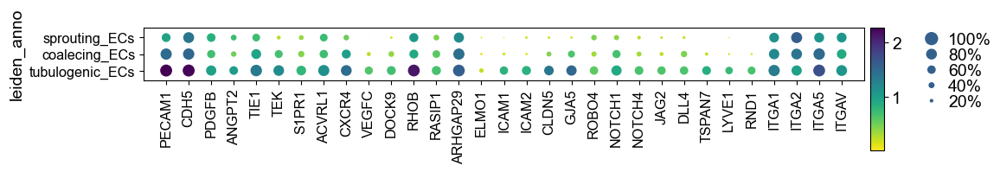

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.85, 0, 0.2, 0.5, 0.25])

In [14]:
ec_ma=["PECAM1", "CDH5", "PDGFB", "ANGPT2", "TIE1", "TEK", "S1PR1", "ACVRL1", "CXCR4", "VEGFC", "DOCK9", "RHOB", 
       "RASIP1", "ARHGAP29", "ELMO1", "ICAM1", "ICAM2", "CLDN5", "GJA5", "ROBO4", "NOTCH1", "NOTCH4", 
       "JAG2", "DLL4", "TSPAN7", "LYVE1", "RND1", "ITGA1", "ITGA2", "ITGA5", "ITGAV" ]
sc.pl.dotplot(adata[np.isin(adata.obs.leiden_anno,
                            [el for el in adata.obs.leiden_anno.cat.categories if "EC" in el])],
             ec_ma,groupby="leiden_anno", color_map="viridis_r",
             save="_day12-18_EC"
             )

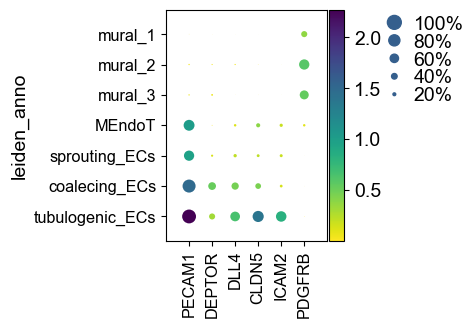

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[2.0999999999999996, 0, 0.2, 0.5, 0.25])

In [25]:
sc.pl.dotplot(adata,["PECAM1", "DEPTOR", "DLL4", "CLDN5", "ICAM2", "PDGFRB"],
              save="day12to18_stained_markers.pdf",
              groupby="leiden_anno",color_map="viridis_r"
             )

Fig. S6 a

In [60]:
adata.obs['leiden_anno_p']=adata.obs['leiden_anno']
ss=adata.obs['leiden_anno']
ss=ss.replace('mural_2','mural')#
ss=ss.replace('mural_3','mural')
ss=ss.replace('tubulogenic_ECs','tubulogenic')#
adata.obs['leiden_anno_p']=ss

In [61]:
adata=adata[np.isin(adata.obs.leiden_anno_p,["mural","MEndoT","tubulogenic"])]

In [62]:
adata_aa=adata[np.isin(adata.obs.batch,["d18a2"])]
adata_mtg=adata[np.isin(adata.obs.batch,["d18m2"])]

In [67]:
adata=adata_mtg.copy()

E:\SR\EC_Data./figures/day18mtg_prolimural_kuchen.pdf


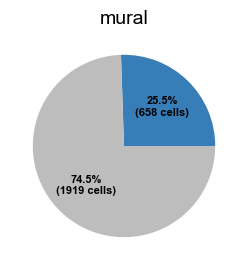

E:\SR\EC_Data./figures/day18mtg_proliMEndoT_kuchen.pdf


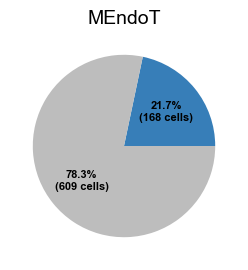

E:\SR\EC_Data./figures/day18mtg_prolitubulogenic_kuchen.pdf


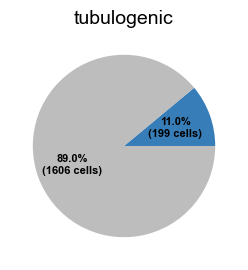

In [68]:
ident="proliferation"
for batch_cat in adata.obs.leiden_anno_p.cat.categories:
    
    recipe=pd.crosstab(adata[np.isin(adata.obs.leiden_anno_p,batch_cat)].obs[ident],"A")
    fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))
    data = list(recipe["A"])
    ingredients = list(recipe.index)
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        return "{:.1f}%\n({:d} cells)".format(pct, absolute)
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                      textprops=dict(color="black"),
                                     colors=adata.uns[ident+"_colors"])
    plt.setp(autotexts, size=8, weight="bold")
    ax.set_title(batch_cat)
    
    save_my_file=os.getcwd()+"./figures/day18mtg_proli"+batch_cat+'_kuchen.pdf'
    print(save_my_file)

    plt.savefig(save_my_file) 
    plt.show()

In [69]:
adata=adata_aa.copy()

E:\SR\EC_Data./figures/day18aa_prolimural_kuchen.pdf


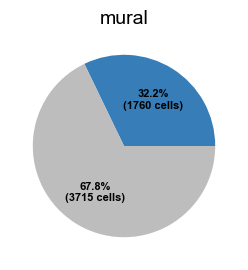

E:\SR\EC_Data./figures/day18aa_proliMEndoT_kuchen.pdf


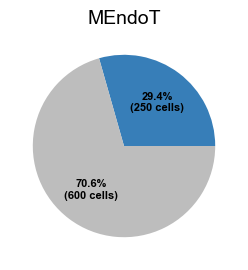

E:\SR\EC_Data./figures/day18aa_prolitubulogenic_kuchen.pdf


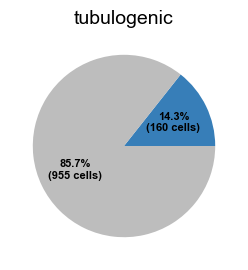

In [70]:
ident="proliferation"
for batch_cat in adata.obs.leiden_anno_p.cat.categories:
    
    recipe=pd.crosstab(adata[np.isin(adata.obs.leiden_anno_p,batch_cat)].obs[ident],"A")
    fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))
    data = list(recipe["A"])
    ingredients = list(recipe.index)
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        return "{:.1f}%\n({:d} cells)".format(pct, absolute)
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                      textprops=dict(color="black"),
                                     colors=adata.uns[ident+"_colors"])
    plt.setp(autotexts, size=8, weight="bold")
    ax.set_title(batch_cat)
    
    save_my_file=os.getcwd()+"./figures/day18aa_proli"+batch_cat+'_kuchen.pdf'
    print(save_my_file)

    plt.savefig(save_my_file) 
    plt.show()

Fig. S6 b

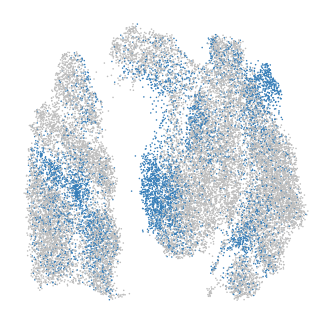

In [40]:
sc.pl.umap(adata,color=[#"leiden_anno","PECAM1","PDGFRB","ACTA2",
                        "proliferation"],
           title='', legend_loc=None, #'right',
            frameon=False,
#            save="_day12to18_proli.png",
           color_map="OrRd")

Fig. S6 c

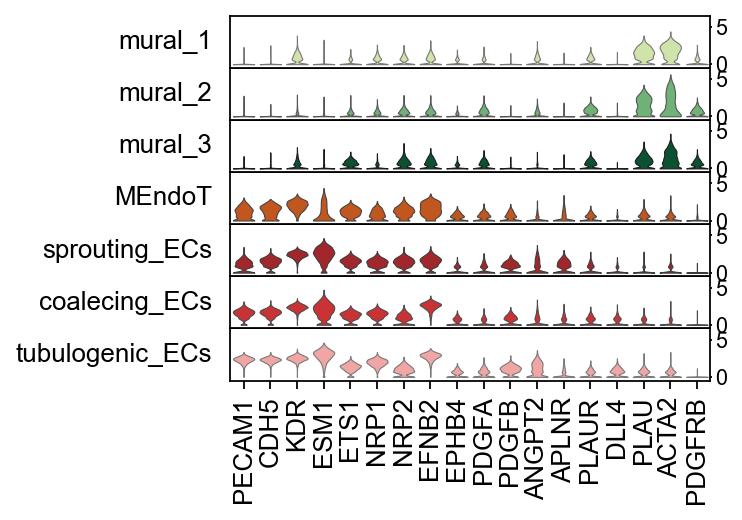

In [35]:
# scv.settings.set_figure_params('scvelo',dpi=150,dpi_save=300)  # for beautified visualization
axes = sc.pl.stacked_violin(adata,var_names=all_marker["Marker"],
                            figsize = [4,3],
                            row_palette=adata.uns["leiden_anno_colors"],
                            groupby="leiden_anno",show=False,
                            var_group_rotation=90)

for ax in axes:
      ax.set_ylim(-0.5, 6.5)
        
# plt.figure(figsize=(20,10)) #does not work here
plt.savefig('./figures/violin_day12to18_leiden_anno.pdf')        
plt.show()

Fig. S6 d

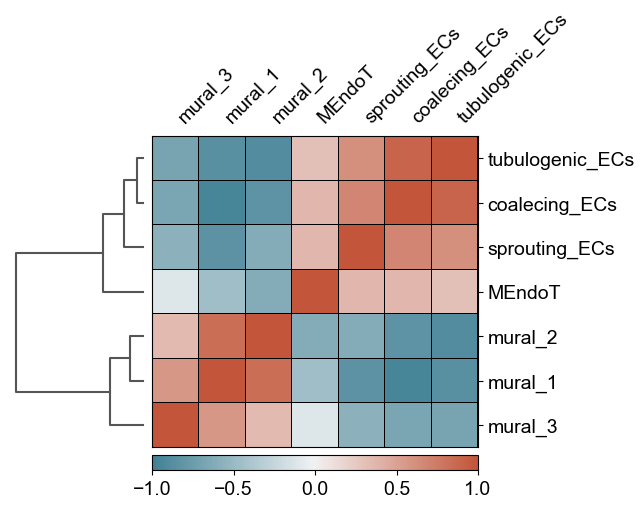

In [32]:
sc.pl.correlation_matrix(adata,'leiden_anno',dendrogram=True,
                         #show_correlation_numbers=True, #cmap='inferno',
                         cmap=sns.diverging_palette(220, 20, n=200, as_cmap=True),
                         save='_day12to18_correlation.pdf', 
                        )

Table S4

In [48]:
pdf=pd.crosstab(adata.obs.leiden_anno,adata.obs.batch)
df = pd.DataFrame(pdf.to_numpy(), pdf.index.categories, pdf.columns.categories)

In [49]:
batch_sum=list(df.sum())
for i in range(len(df.columns)):
               col=list(df.columns)[i]
               df[col+"_perc"]=round(df[col]/batch_sum[i]*100, 1)

In [50]:
df

,d12m2,d18m2,d18a2,d12m2_perc,d18m2_perc,d18a2_perc
mural_1,4950,197,104,44.3,3.5,1.4
mural_2,198,1762,4528,1.8,31.2,59.8
mural_3,980,816,949,8.8,14.4,12.5
MEndoT,13,779,850,0.1,13.8,11.2
sprouting_ECs,1789,107,5,16.0,1.9,0.1
coalecing_ECs,3218,188,17,28.8,3.3,0.2
tubulogenic_ECs,31,1805,1116,0.3,31.9,14.7


Fig. S7 d

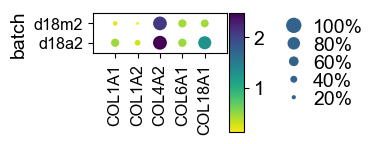

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.75, 0, 0.2, 0.5, 0.25])

In [11]:
adata18=adata[np.isin(adata.obs.batch,[el for el in adata.obs.batch.cat.categories if "18" in el])]
adata18t=adata18[np.isin(adata18.obs.leiden_anno,["tubulogenic_ECs"])]

l=[el for el in adata.raw.var_names if "COL18" in el]
# ['COL6A3', 'COL6A5', 'COL6A6', ]
l.sort()
l

sc.pl.dotplot(adata18t,
              ['COL1A1','COL1A2','COL4A2','COL6A1']+l
              ,groupby="batch", 
              save="_day12to18_cols.pdf",
              color_map="viridis_r")

Gene expression of IF staining targets 

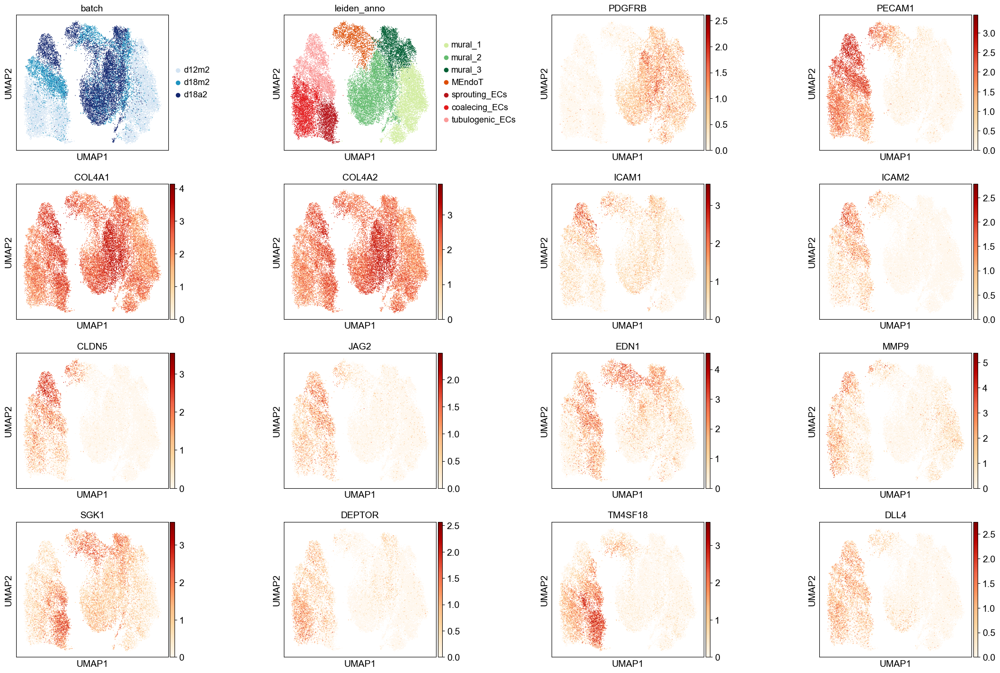

In [71]:
sc.pl.umap(adata, color=["batch", "leiden_anno",
                         "PDGFRB", "PECAM1",'COL4A1','COL4A2', "ICAM1", "ICAM2", "CLDN5",
                          "JAG2", "EDN1", "MMP9", "SGK1", "DEPTOR", "TM4SF18", "DLL4"],
           save="_Marker_staining_day12_to_18.pdf",
           wspace=.6, color_map="OrRd")

Fig. 6 a

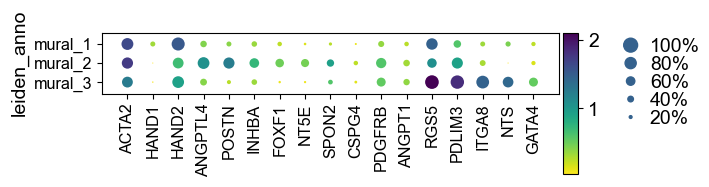

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[5.949999999999999, 0, 0.2, 0.5, 0.25])

In [123]:
peri_ma=['ACTA2', 'HAND1', 'HAND2', 'ANGPTL4', 'POSTN', 'INHBA', 'FOXF1', 'NT5E', 
         'SPON2', 'CSPG4', 'PDGFRB', 'ANGPT1', 'RGS5', 'PDLIM3', 'ITGA8', 'NTS', 'GATA4' ]#, 
sc.pl.dotplot(adata[np.isin(adata.obs.leiden_anno,
                            [el for el in adata.obs.leiden_anno.cat.categories if "mural" in el])],
             peri_ma,groupby="leiden_anno", 
              save='_d12to18_peri_ma.pdf',
              color_map="viridis_r")

In [20]:
adata.write(r"E:\SR\EC_Data\processed\dataset_8_day12to18.h5ad",compression="gzip")

save dataset for NicheNet analysis

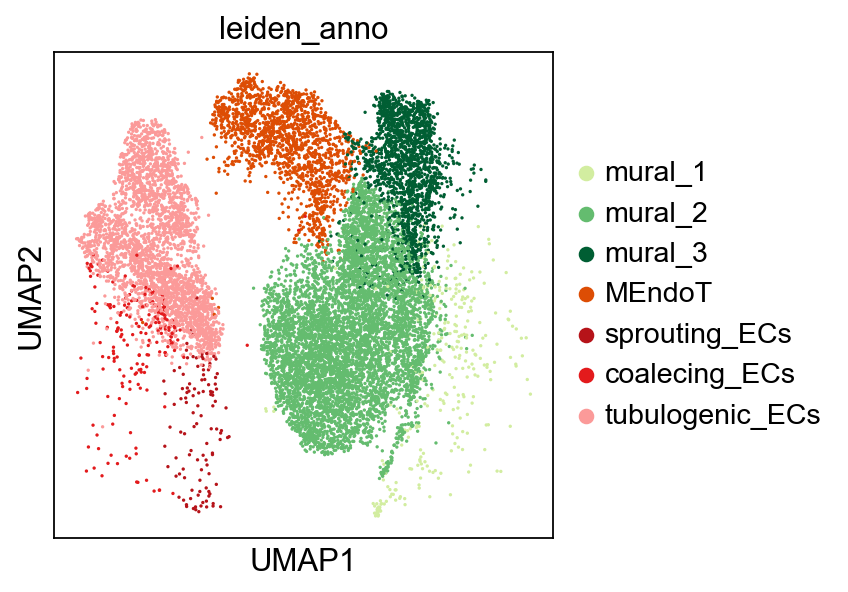

In [18]:
mxdata=adata[np.isin(adata.obs.batch,["d18m2","d18a2"])]
sc.pl.umap(mxdata,
          color="leiden_anno")

In [20]:
os.chdir(r'I:\DATA\HPC\Thesis_data\ToC')
os.getcwd()
folder_name="20210330_day12to18"
seq.write_to_csv(mxdata,folder_name)

writing .csv files to 20210330_day12to18


## Dataset 9 - maturation in 3D Matrigel culture on day 18, velocity integration

This dataset is used in Fig. 5

In [117]:
adata=sc.read_h5ad('dataset_9.h5ad')

In [ ]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo',dpi=50,dpi_save=600)  # for beautified visualization
# sc.settings.set_figure_params(dpi=150,dpi_save=300,transparent=True)
scv.pl.velocity_embedding_stream(adata, basis='umap',color=['latent_time'],
                                 figsize = (6, 6), 
#                                  save="20210203_day12_18_latent_time_dynamic.pdf",
                                 legend_loc=None,color_map="OrRd")
sc.settings.set_figure_params(dpi=50,dpi_save=600)

Fig. 6 c

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:07) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_paga_overlay_d12mc_based_on_velocity_psudotime.png


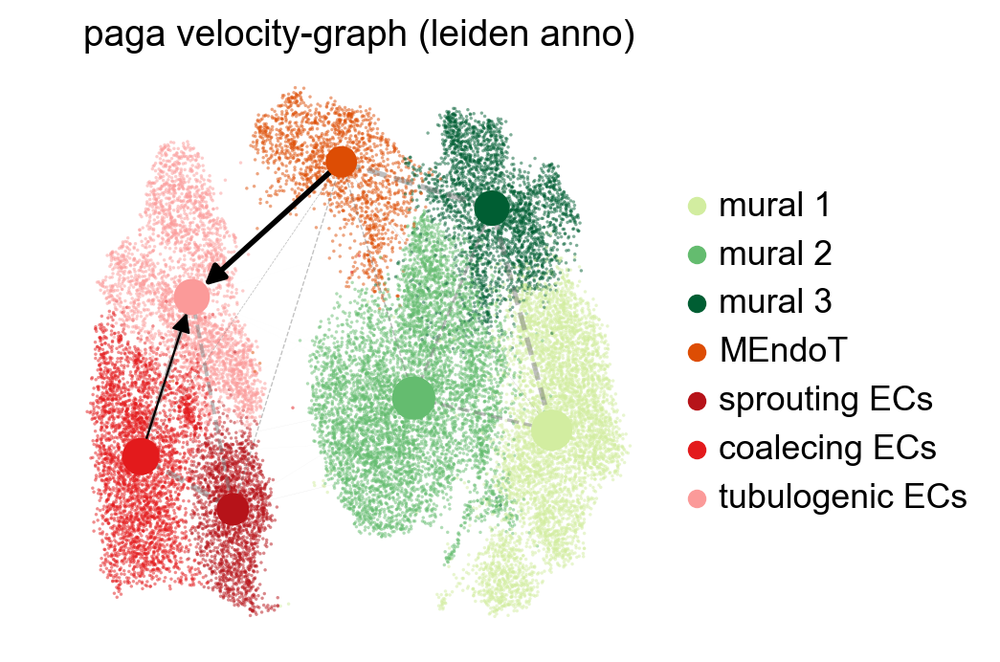

In [373]:
scv.tl.paga(adata,"leiden_anno",#vkey='latent_time',
#     use_time_prior="latent_time"
           )
sc.settings.set_figure_params(dpi=100,dpi_save=600,)
scv.pl.paga(adata, basis='umap', threshold=0, frameon=False, legend_loc='right',edge_width_scale=0.8,
           save="paga_overlay_d12mc_based_on_velocity_psudotime.pdf"
           )

In [374]:
adata.write("./processed/dataset_9.h5ad",compression="gzip")